In [1]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [1]:
!nvidia-smi

Wed Apr 27 17:08:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 13033, done.
remote: Total 13033 (delta 0), reused 0 (delta 0), pack-reused 13033
Receiving objects: 100% (13033/13033), 11.91 MiB | 32.78 MiB/s, done.
Resolving deltas: 100% (9059/9059), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.0 MB/s 


In [3]:
import xml.etree.ElementTree as ET
import os
CLASSES = ['with_mask', 'without_mask', 'mask_weared_incorrect']
def convert_bbox(box, img_size):
    dw = 1. / (img_size[0])
    dh = 1. / (img_size[1])
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = round(x * dw, 6)
    w = round(w * dw, 6)
    y = round(y * dh, 6)
    h = round(h * dh, 6)
    return (x,y,w,h)

In [4]:
def convert_ann(xml_path, yolo_path):
    file_in = open(xml_path, 'r')
    tree = ET.parse(file_in)
    
    has_label = False
    file_out = open(yolo_path, 'w')
    for ele in tree.iter():
        if 'size' in ele.tag:
            img_w = int(ele.find('width').text)
            img_h = int(ele.find('height').text)
            
        if 'object' in ele.tag:
            has_label = True
            name = ele.find('name').text
            class_id = CLASSES.index(name)
            xml_box = ele.find('bndbox')
            bbox = (float(xml_box.find('xmin').text),
                    float(xml_box.find('xmax').text),
                    float(xml_box.find('ymin').text),
                    float(xml_box.find('ymax').text))
            bbox = convert_bbox(bbox, (img_w, img_h))
            file_out.write(str(class_id) + ' ' + ' '.join([str(s) for s in bbox]) + '\n')
             
    if not has_label:
        print(xml_path)
        
    file_in.close()
    file_out.close()

In [7]:
xml_base = '/content/drive/MyDrive/annotations (1)'
yolo_base = '/content/drive/MyDrive'

xml_files = os.listdir(xml_base)
for xml_file in xml_files:
    yolo_file = xml_file.split('.')[0] + '.txt'
    convert_ann(os.path.join(xml_base, xml_file), os.path.join(yolo_base, yolo_file))

In [8]:

from sklearn.model_selection import train_test_split
len(os.listdir(yolo_base))

877

In [9]:
all_files = os.listdir("/content/drive/MyDrive/images (1)")
len(all_files)

853

In [10]:
train_files, test_files = train_test_split(all_files, test_size=0.2, random_state=1337)
val_files, test_files =  train_test_split(test_files, test_size=0.5, random_state=1337)

In [11]:
print('Train files:', len(train_files))
print('Val files:', len(val_files))
print('Test files:', len(test_files))

Train files: 682
Val files: 85
Test files: 86


In [12]:
import shutil
import tqdm
!mkdir facemask
%ls

CONTRIBUTING.md  export.py   LICENSE    requirements.txt*  tutorial.ipynb
data/            facemask/   models/    setup.cfg          utils/
detect.py        hubconf.py  README.md  train.py           val.py


In [13]:
!mkdir -p facemask/train/images
!mkdir -p facemask/train/labels
!mkdir -p facemask/val/images
!mkdir -p facemask/val/labels
!mkdir -p facemask/test/images
!mkdir -p facemask/test/labels

In [14]:
img_base = '/content/drive/MyDrive/images (1)'

In [15]:
def move_files(files, type='train'):
    for file in tqdm.tqdm(files):
        img_src = os.path.join(img_base, file)
        ann_src = os.path.join(yolo_base, file.split('.')[0] + '.txt')
        img_dst = 'facemask/' + type +'/images/' + file
        ann_dst = 'facemask/' + type +'/labels/' + file.split('.')[0] + '.txt'
        shutil.copy(img_src, img_dst)
        shutil.copy(ann_src, ann_dst)
    print('Complete move', type, 'files')

In [16]:
move_files(train_files, 'train')
move_files(test_files, 'test')
move_files(val_files, 'val')

100%|██████████| 682/682 [00:13<00:00, 52.08it/s] 


Complete move train files


100%|██████████| 86/86 [00:00<00:00, 277.99it/s]


Complete move test files


100%|██████████| 85/85 [00:00<00:00, 286.87it/s]

Complete move val files


In [17]:
yaml_text = """train: facemask/train/images
val: facemask/val/images

nc: 3
names: ['with_mask', 'without_mask', 'incorrect_mask']"""

In [18]:
with open("facemask.yaml", 'w') as f:
    f.write(yaml_text)

In [19]:
%cat facemask.yaml

train: facemask/train/images
val: facemask/val/images

nc: 3
names: ['with_mask', 'without_mask', 'incorrect_mask']

In [20]:
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline  

In [21]:
!pip install wandb
!wandb disabled

     |████████████████████████████████| 1.8 MB 5.1 MB/s 
     |████████████████████████████████| 144 kB 72.5 MB/s 
     |████████████████████████████████| 181 kB 44.3 MB/s 
     |████████████████████████████████| 63 kB 2.4 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=2baf5d7a3e9cb36a06c4f6472e51bec1b2d0521376cb52492a1d884bbcc172de
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools
W&B disabled.


In [22]:
start = datetime.now()
!python train.py --img 640 --batch 32 --epochs 30 --data facemask.yaml --weights yolov5m.pt
end = datetime.now()
print('Trainine time:', end - start)

train: weights=yolov5m.pt, cfg=, data=facemask.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-163-gb53917d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, transla

In [23]:
def show_images(path, num=20):
    cnt = 0
    for file in os.listdir(path):
        img = plt.imread(os.path.join(path, file))
        plt.figure(figsize=(20, 15))
        plt.imshow(img)
        plt.axis('off')
        if cnt == num:
            break
        plt.xticks([])
        plt.yticks([])
        plt.show()
        cnt += 1

In [36]:

!python detect.py --source facemask/anh/ --weight runs/train/exp/weights/best.pt --img 640 --conf 0.4

detect: weights=['runs/train/exp/weights/best.pt'], source=facemask/anh/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-163-gb53917d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
image 1/14 /content/yolov5/facemask/anh/260019dd686c6916_054a35aa1529a4df_9415715806500578185710.png: 448x640 1 with_mask, Done. (0.022s)
image 2/14 /content/yolov5/facemask/anh/278344673_1077400206194982_7519755989869974582_n.jpg: 640x416 1 with_mask, 1 without_mask, Done. (0.022s)
image 3/14 /content/yolov5/facemask/anh/278413723_523426692514198_9082169773060450660_n.jpg: 640

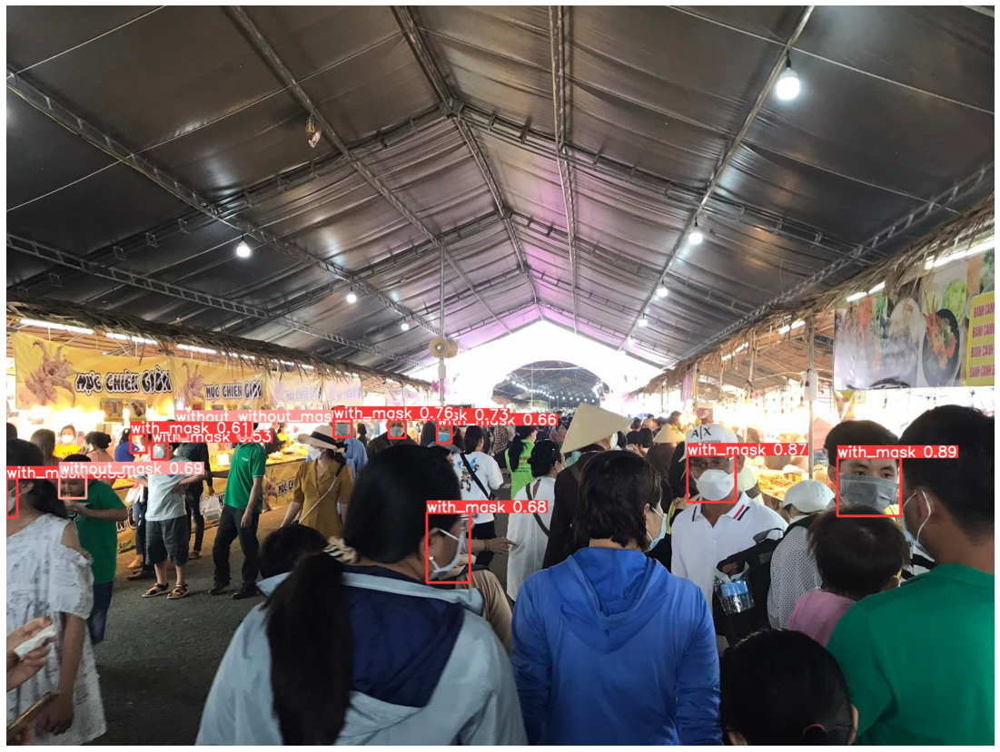

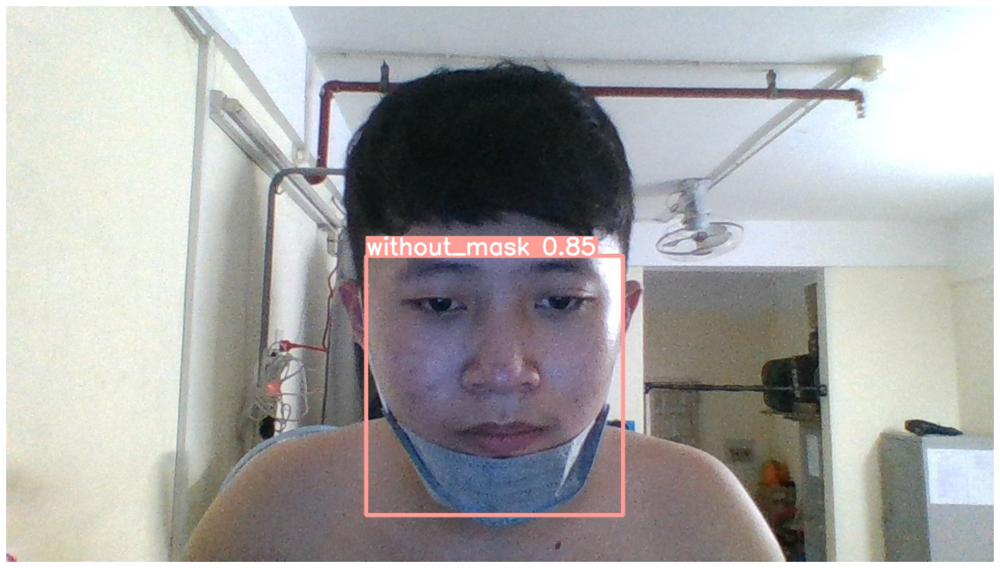

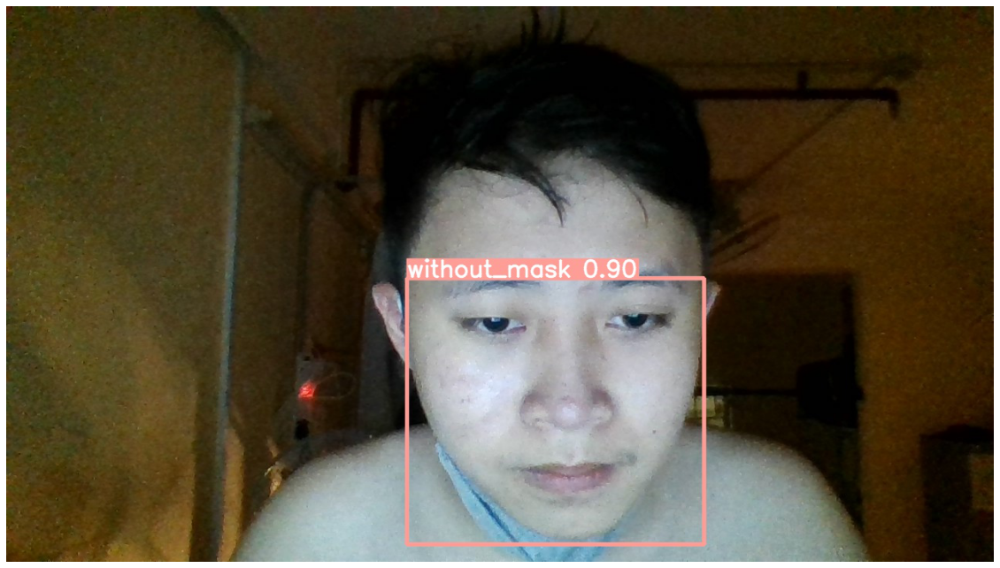

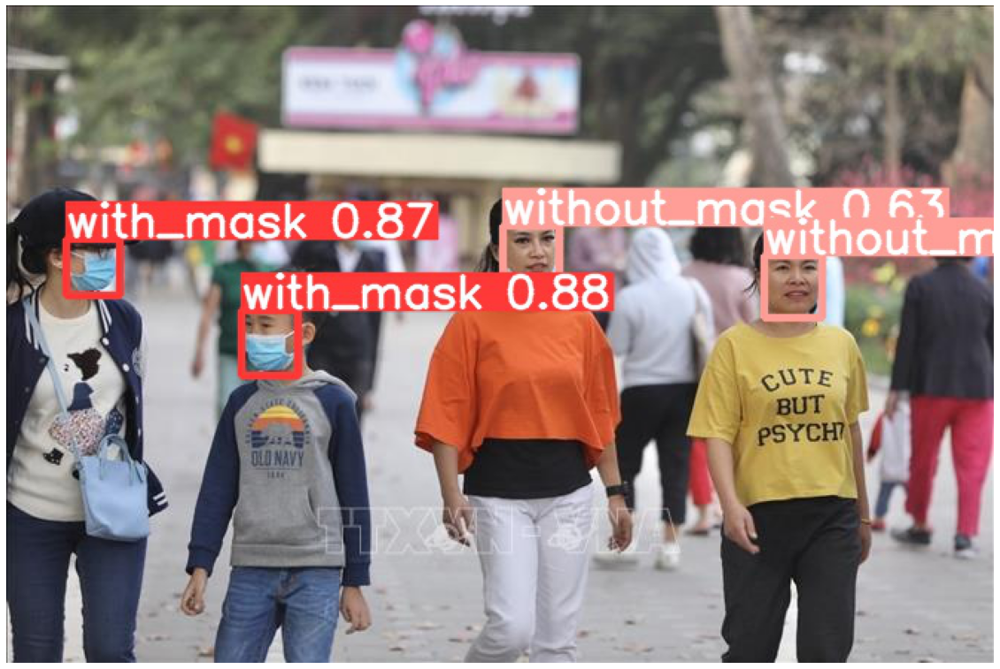

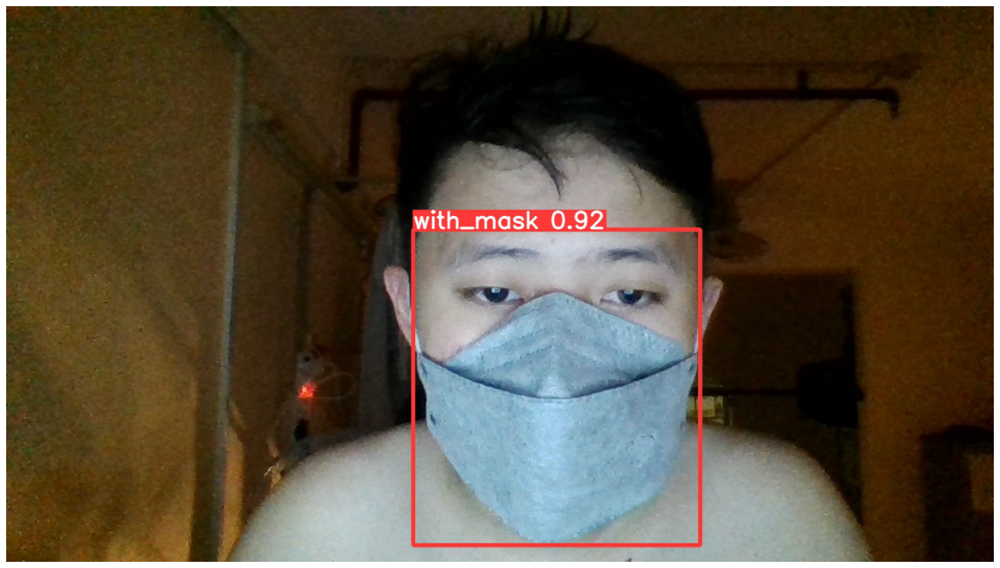

...

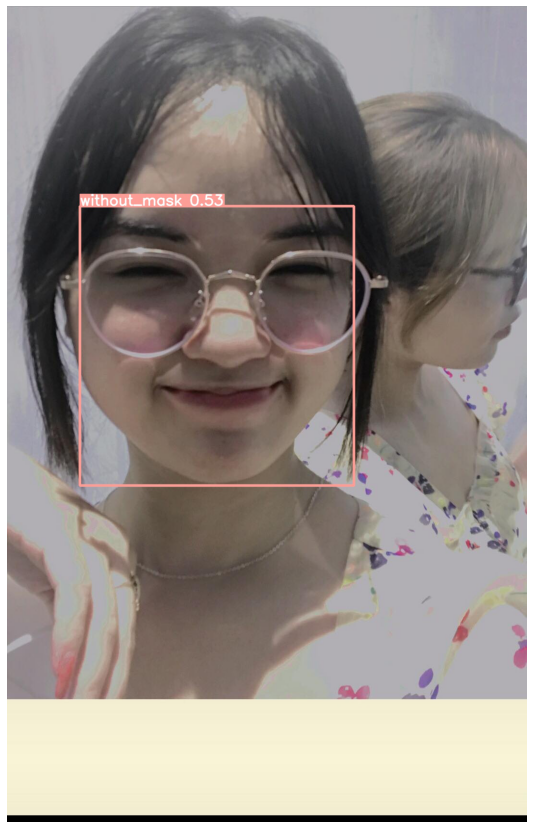

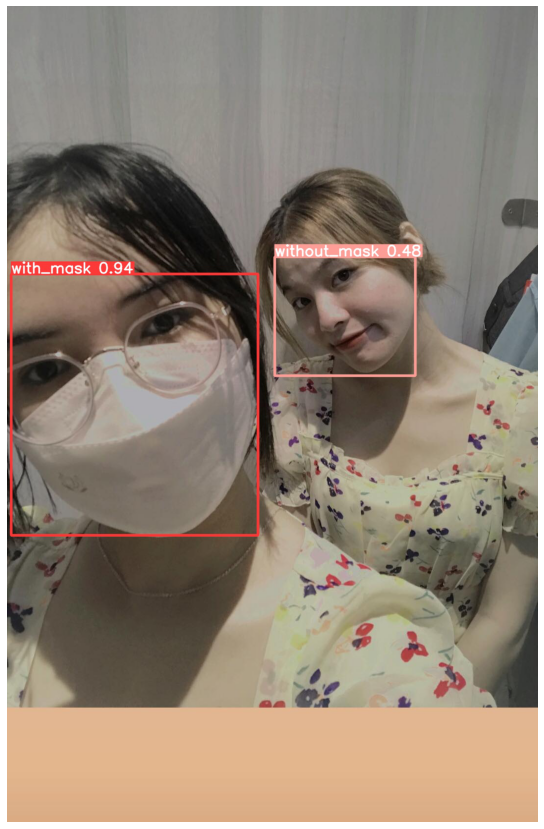

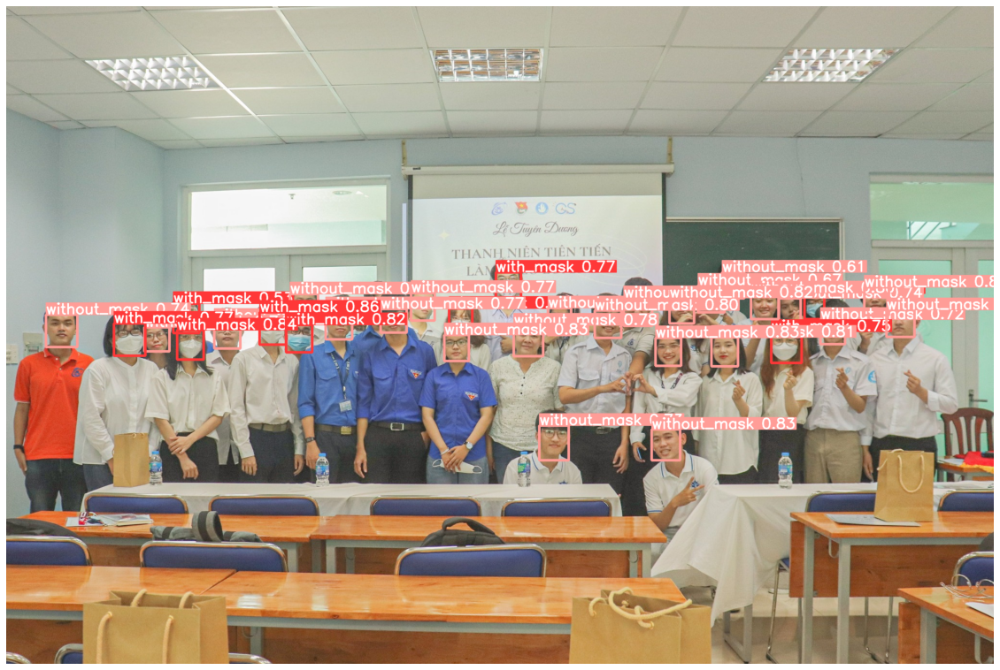

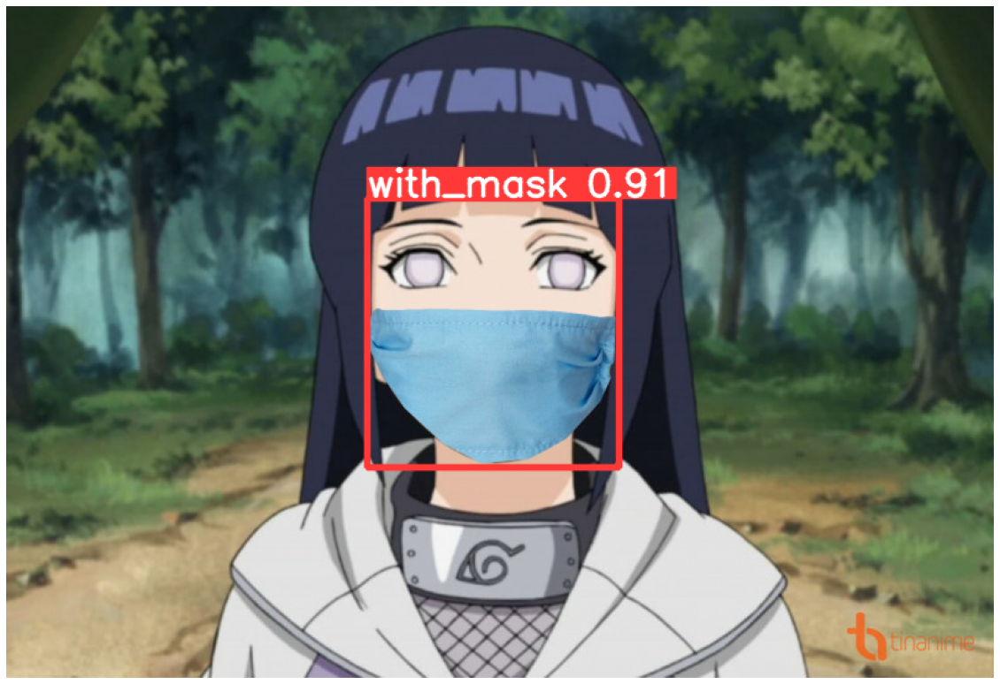

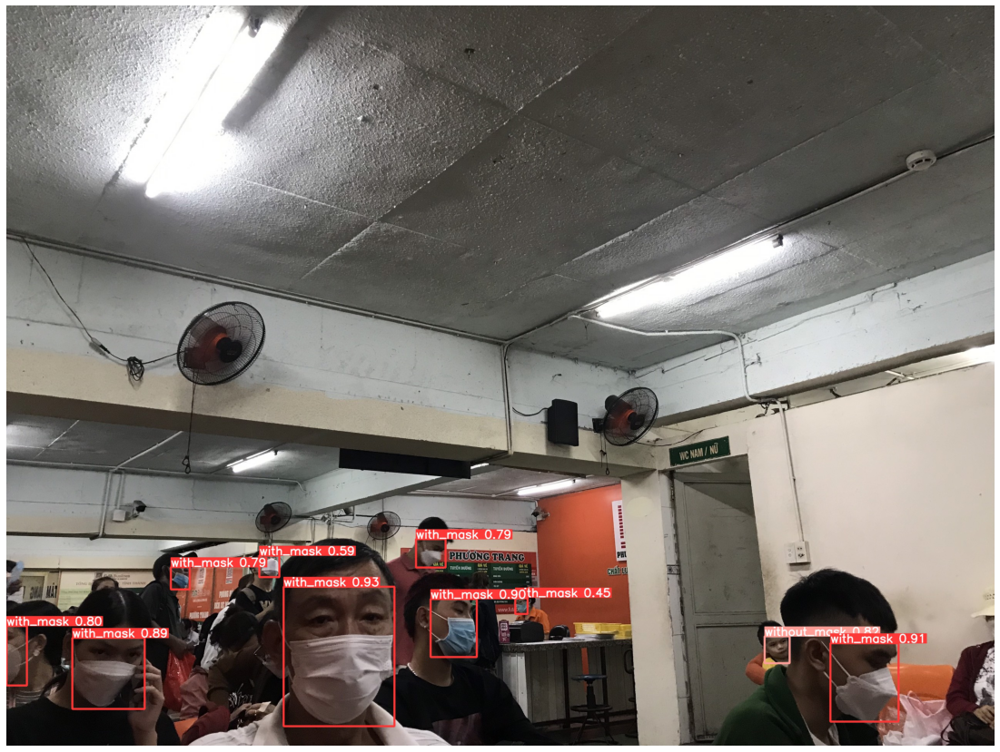

In [37]:
show_images('runs/detect/exp7')

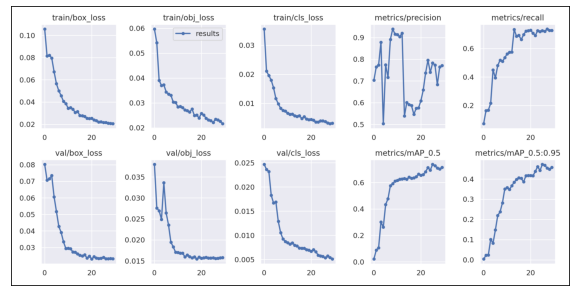

In [33]:
res_path = 'runs/train/exp/results.png'
plt.figure(figsize=(10, 10))
img = plt.imread(res_path)
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.show()
# nhớ chuyển sang GPU